# Billar

## Introducción

Este notebook prograremos un billar en dos dimensiones, y para esto revisaremos que es un movimiento rectilíneo uniforme 

Antes de comenzar daremos un par de definiciones 

La **velocidad** de una partícula se define como, la taza de cambio de la posición con respecto al tiempo, es decir:
 
\begin{equation}
\vec{v} \equiv \dfrac{d\vec{r}}{dt}
\end{equation}



La **cantidad de movimiento** o **momento** de una partícula se define como:
 
\begin{equation}
\vec{p} \equiv m\vec{v}
\end{equation}

### Leyes de Newton
- Un cuerpo permanece en estado de reposo o velocidad constante (aceleración cero) a menos que una fuerza actúe sobre él.


- La taza de cambio de la cantidad de moviento de un cuerpo con respecto al tiempo, es igual a la fuerza que actua sobre este. 
\begin{equation}
\vec{F} = \dfrac{d \vec{p}}{dt}
\end{equation}

- Si dos cuerpos ejercen fuerzas uno sobre otro, estas fuerzas son iguales en magnitud y opuestas en dirección.

\begin{equation}
\vec{F}_1 = -\vec{F}_2
\end{equation}

### Movimiento Rectilíneo Uniforme 

Se define el *Movimiento Rectilíneo Uniforme* como aquél que describe una partícula tal que la suma total de fuerzas que actuán sobre ella es cero. Ahora si suponemos que el movimiento es en una dimensión y de la segunda ley de Newton se tiene:



$\dfrac{d p}{dt} = 0$, de la definición de momento y suponiendo que la masa es constante para todo tiempo $m\dfrac{d V}{dt} = 0$ y de la definicíon de velocidad tenemos que $ \dfrac{d^2 x}{dt^2} = 0$ y como la segunda derivada de la posición es igual a cero, entonces la primer derivada es igual a una constante $V_{x_0}$, es decir $\dfrac{dx}{dt} =V_{x_0}$. Integrando $\displaystyle \int dx= V_{x_0}\displaystyle \int dt$, entonces $x = x_0 + V_{x_0}t$, con $x_0$ una constante la cual es la posición inicial. Si el movimiento es dos dimensiones, entonces tenemos que el movimiento esta dado por: $$x = x_0 + V_{x_0}t $$ $$ y = y_0 + V_{y_0}t$$


In [1]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [2]:
from scipy import*
from pylab import *
from math import *
from mpl_toolkits.mplot3d import Axes3D
#import random
%matplotlib inline
#####################
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from JSAnimation import IPython_display

A continiación graficaremos un movimiento rectilíneo uniforme en dos dimensiones 

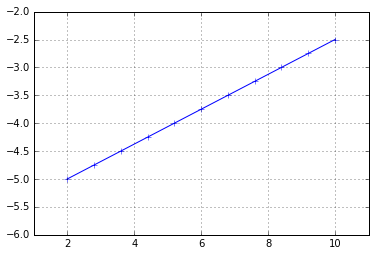

In [3]:
t = linspace(0,10,11)
x0 = 2
y0 = -5
vx_0 = 0.8
vy_0 = 0.25
x = x0 + vx_0*t
y = y0 + vy_0*t
plot(x,y,"+-")
xlim(1,11)
ylim(-6,-2)
grid(True)

In [4]:
def caja(ent,r):
    if ent[0] >= 1.0 -r:
        ent[0]=2.0 -2*r - ent[0]
        ent[2] = - ent[2] 

    elif ent[0]<=0+ r:
        ent[0]=+ 2*r -ent[0]
        ent[2]=-ent[2] 
        

    elif ent[1] >= 1.0 - r:
        ent[1] = 2.0 -2*r- ent[1]
        ent[3] = -ent[3]
        
    elif ent[1] <=0. +r:
        ent[1] = -ent[1] +2*r
        ent[3] = -ent[3]
    
    else: ent = ent
        
        
    return [ent[0],ent[1],ent[2],ent[3]]
       

In [5]:
def billar(ent,T,dt):
    t = 0
    x_out = []  
    y_out = []  
    vx_out = [] 
    vy_out = [] 
    r = .02
    while t <T:
        ent = caja(ent,r)
        
        x_out.append(ent[0])
        y_out.append(ent[1])
        vx_out.append(ent[2])
        
        vy_out.append(ent[3])
    
        t=t+dt
        ent[0]=ent[0]+ent[2]*dt
        ent[1]=ent[1]+ent[3]*dt
    return x_out, y_out, vx_out, vy_out


#2e4559


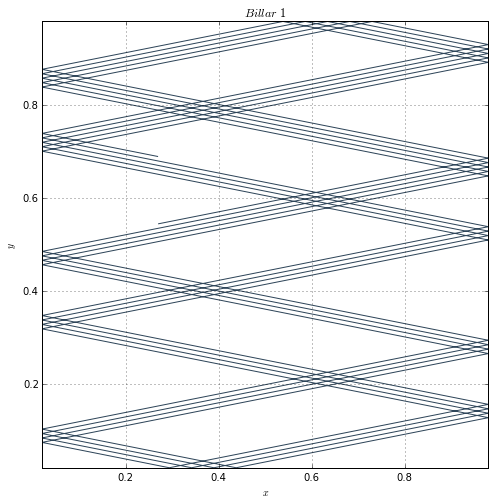

#160f46


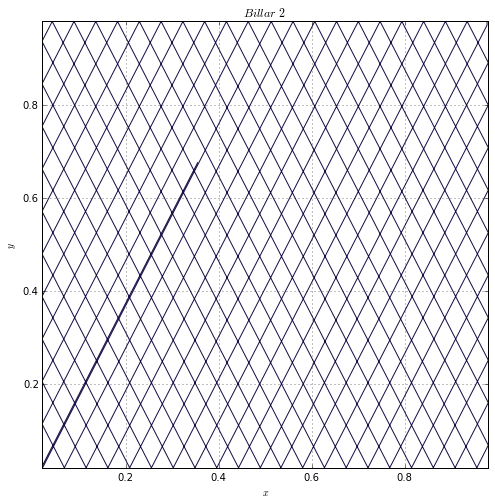

#344225


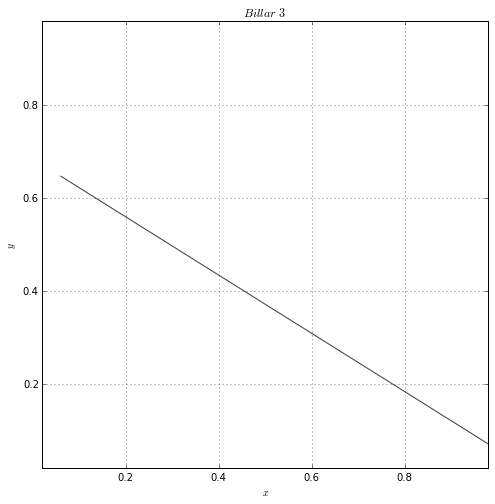

#0c4408


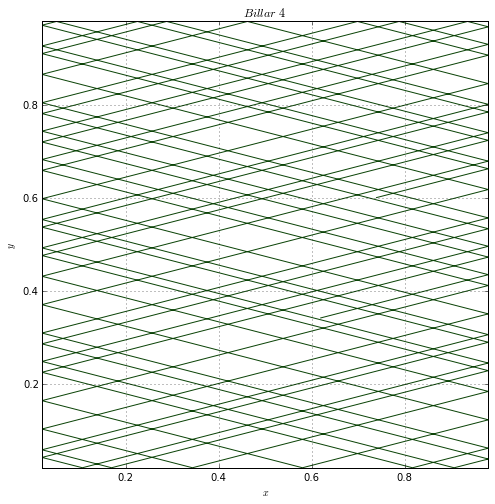

#0d3c50


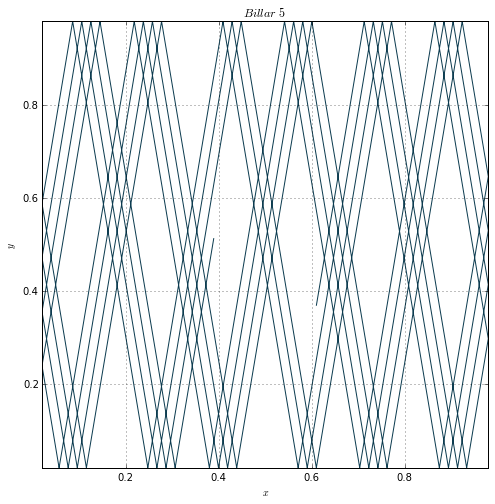

In [6]:
i = 0
while i < 5:
    #x, y, vx, vy= billar([rand(),rand(),rand(),rand()],1000,2e-4)
    salida = billar([rand(),rand(),rand(),rand()],50,2e-4)
    figure(i, figsize=(8, 8))
    c='#%02x%02x%02x' % (100*rand(), 100*rand(), 100*rand())
    print (c)
    plot(salida[0], salida[1],"-", color=c)
    ylabel("$y$")
    xlabel("$x$")
    grid(True)
    xlim(0.02,0.98)
    ylim(.02,0.98)
    #savefig("test.png")
    name = "$Billar$ $%g$" %(i+1)
    title(name)
    show()
    i = i + 1
    

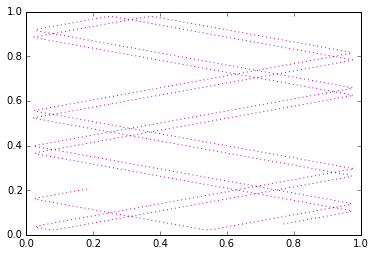

In [12]:
x, y, vx, vy = billar([rand(),rand(),rand(),rand()],15,2e-2)
plot(x,y,":",color="m")

In [13]:
len(x)

751

751



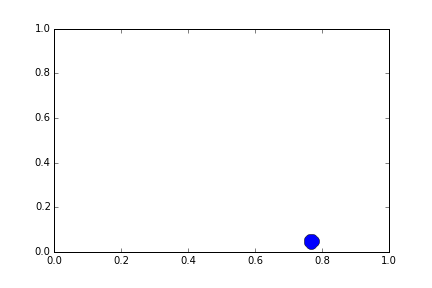
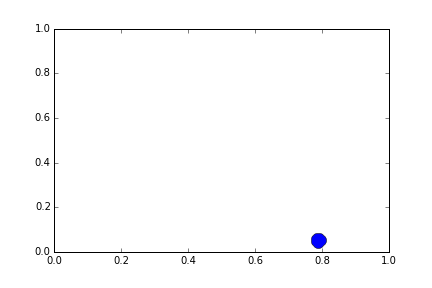
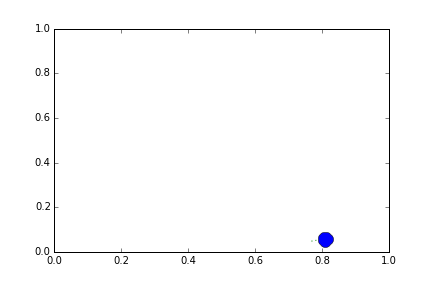
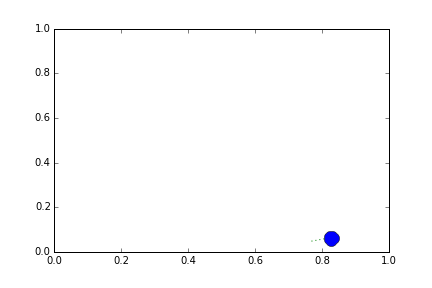
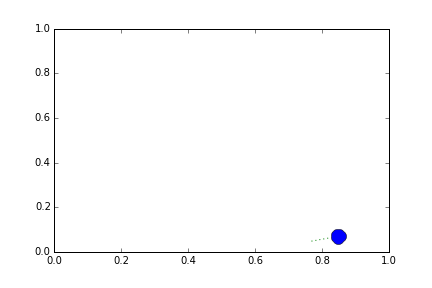
...
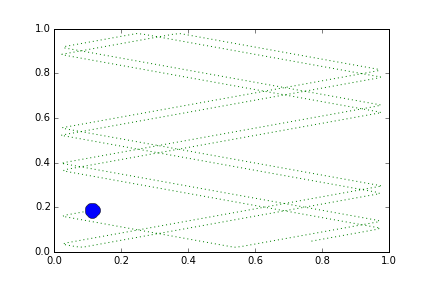
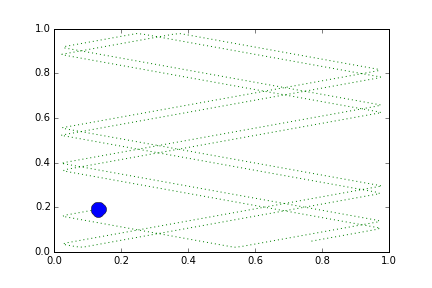
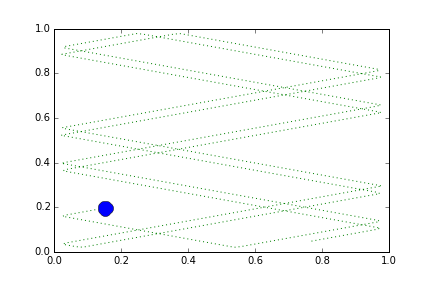
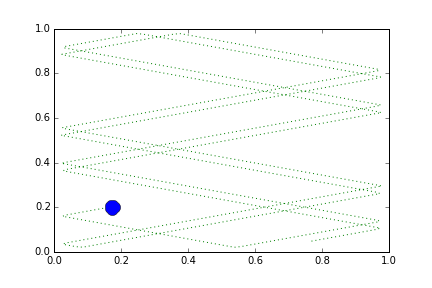
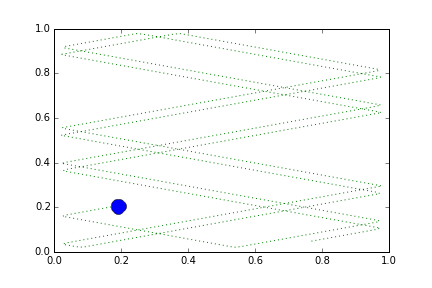

In [14]:
# JSAnimation import available at https://github.com/jakevdp/JSAnimation
figura = figure()
ejes = axes(xlim=(0, 1), ylim=(0, 1))
trayectoria, = ejes.plot([], [], ':',color='g')
pelota, = ejes.plot([], [], 'o',markersize=15)

def init():
    trayectoria.set_data([], [])
    pelota.set_data([], [])
    return trayectoria,pelota

def animate(i):
    trayectoria.set_data(x[:i], y[:i])
    pelota.set_data(x[i], y[i])
    return trayectoria,pelota
print(len(x))
animation.FuncAnimation(figura, animate, init_func=init,
                        frames=len(x), interval=60)